# CONFIG

In [1]:
import copy
import os
import time

import matplotlib.pyplot as plt
import pandas as pd
import segmentation_models_pytorch as smp
import torch
from scripts.config import (
    ACTIVATION,
    BATCH_SIZE,
    BEST_MODEL_DIR,
    CLASSES,
    DATA_DIR,
    BOX_DIR,
    RAPID_DIR,
    ROBUST_DIR,
    DECODER,
    DEVICE,
    ENCODER,
    ENCODER_WEIGHTS,
    EVAL_ON_MASKS,
    EXPORT_BEST_MODEL,
    EXPORT_CSV_DIR,
    GAMMA,
    LEARNING_RATE,
    LEARNING_RATE_SCHEDULING,
    LOSS,
    MODE,
    N_EPOCHS,
    OPTIMIZER,
    PER_X_BATCH,
    PER_X_EPOCH,
    PER_X_EPOCH_PLOT,
    SCHEDULE_TYPE,
    START_EPOCH,
    STATE,
    STEP_SIZE,
    TRAINING_INPUT,
    WEIGHT_DECAY,
)
from scripts.dataset import Colonoscopy_Dataset
from scripts.tools import (
    epoch_time,
    human_sort,
    label_colors,
    return_batch_information,
    return_files_in_directory,
)
from torch.nn import CrossEntropyLoss
from torch.optim.lr_scheduler import ExponentialLR, StepLR
from torch.utils.data import DataLoader
from torchmetrics import JaccardIndex
from tqdm import tqdm
from sklearn.model_selection import train_test_split

image_files = return_files_in_directory(DATA_DIR + "/original", ".tif")
mask_files = return_files_in_directory(DATA_DIR + "/ground_truth", ".tif")
box_files = return_files_in_directory(BOX_DIR, ".png")
rapid_masks = return_files_in_directory(RAPID_DIR, ".png")
robust_masks = return_files_in_directory(ROBUST_DIR, ".png")

human_sort(image_files)
human_sort(mask_files)
human_sort(box_files)
human_sort(rapid_masks)
human_sort(robust_masks)


if TRAINING_INPUT == "boxes":
    X_train, X_test, y_train, y_test = train_test_split(
        image_files, box_files, test_size=0.1, random_state=1
    )
elif TRAINING_INPUT == "rapid_boxshrink":
    X_train, X_test, y_train, y_test = train_test_split(
        image_files, rapid_masks, test_size=0.1, random_state=1
    )
elif TRAINING_INPUT == "robust_boxshrink":
    X_train, X_test, y_train, y_test = train_test_split(
        image_files, robust_masks, test_size=0.1, random_state=1
    )
else:
    X_train, X_test, y_train, y_test = train_test_split(
        image_files, mask_files, test_size=0.1, random_state=1
    )

X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.11111, random_state=1
)  # 0.1111 x 0.9 = 0.1

if EVAL_ON_MASKS == True:
    if TRAINING_INPUT == "boxes":
        y_val = [
            i.replace("boxmasks", "ground_truth").replace("png", "tif") for i in y_val
        ]
        y_test = [
            i.replace("boxmasks", "ground_truth").replace("png", "tif") for i in y_test
        ]
    elif TRAINING_INPUT == "rapid_boxshrink":
        y_val = [
            i.replace("testing/rapid_boxshrink", "ground_truth").replace("png", "tif")
            for i in y_val
        ]
        y_test = [
            i.replace("testing/rapid_boxshrink", "ground_truth").replace("png", "tif")
            for i in y_test
        ]
    elif TRAINING_INPUT == "robust_boxshrink":
        y_val = [
            i.replace("testing/robust_boxshrink", "ground_truth").replace("png", "tif")
            for i in y_val
        ]
        y_test = [
            i.replace("testing/robust_boxshrink", "ground_truth").replace("png", "tif")
            for i in y_test
        ]

train_dataset = Colonoscopy_Dataset(X_train, y_train, limit_dataset_size=50)

test_dataset = Colonoscopy_Dataset(X_test, y_test, limit_dataset_size=50)

val_dataset = Colonoscopy_Dataset(X_val, y_val, limit_dataset_size=50)

train_loader = DataLoader(
    train_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0
)
test_loader = DataLoader(
    test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0
)
val_loader = DataLoader(
    val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0
)

# create segmentation model with pretrained encoder
if DECODER == "Unet":
    model = smp.Unet(
        encoder_name=ENCODER,
        encoder_weights=ENCODER_WEIGHTS,
        classes=len(CLASSES),
        activation=ACTIVATION,
    )

elif DECODER == "DeepLabV3+":
    model = smp.Unet(
        encoder_name=ENCODER,
        encoder_weights=ENCODER_WEIGHTS,
        classes=len(CLASSES),
        activation=ACTIVATION,
    )

if OPTIMIZER == "SGD":
    optimizer = torch.optim.SGD(model.parameters(), lr=LEARNING_RATE)
if OPTIMIZER == "Adam":
    optimizer = torch.optim.Adam(
        model.parameters(), lr=LEARNING_RATE, weight_decay=WEIGHT_DECAY
    )

    # Learning rate scheduling
if LEARNING_RATE_SCHEDULING == True and SCHEDULE_TYPE == "STEP":
    scheduler = StepLR(optimizer, step_size=STEP_SIZE, gamma=GAMMA, verbose=True)
elif LEARNING_RATE_SCHEDULING == True and SCHEDULE_TYPE == "EXPONENTIAL":
    STEP_SIZE = "Not needed"
    scheduler = ExponentialLR(optimizer, gamma=GAMMA, verbose=True)
elif LEARNING_RATE_SCHEDULING == False:
    STEP_SIZE = "No scheduling"
    GAMMA = "No scheduling"
    SCHEDULE_TYPE = "No scheduling"

# Setup date for model name
from datetime import date


Adjusting learning rate of group 0 to 1.0000e-04.


# PREPROCESSING

In [2]:

today = date.today()
datestring = today.strftime("%Y-%m-%d")
# Instantiate accuracy and loss tracker
best_train_loss = float("inf")
best_valid_loss = float("inf")
best_valid_iou = 0
best_train_iou = 0

# Build dataframe to collect loss and metric data
df_train = pd.DataFrame(columns=["epoch", "loss", "avg_loss", "mean_iou"])
df_val = pd.DataFrame(columns=["epoch", "loss", "avg_loss", "mean_iou"])
# # Determine column types train
# Dummy entry to prevent visualization bug that large values are plotted as zero
if LOSS == "CrossEntropyLoss":
    criterion = CrossEntropyLoss()
    criterion_double = CrossEntropyLoss()
jaccard = JaccardIndex(task = "multiclass", num_classes=len(CLASSES), reduction="elementwise_mean").to(
    DEVICE
)

validate_training_targets = '/'.join(y_train[0].split('/')[-4:])
validate_training_targets
validate_val_targets = '/'.join(y_val[0].split('/')[-4:])
validate_val_targets
validate_test_targets = '/'.join(y_test[0].split('/')[-4:])
validate_test_targets

# Make sure we have the correct labels
print(f"Train targets from: {validate_training_targets}")
print(f"Val targets from: {validate_val_targets}")
print(f"Test targets from: {validate_test_targets}")

torch.backends.cudnn.benchmark = True
train_start_time = time.time()
train_iou_score = torch.tensor([0])
early_stopped = 0

Train targets from: boxshrink/data/boxmasks/519.png
Val targets from: boxshrink/data/ground_truth/529.tif
Test targets from: boxshrink/data/ground_truth/494.tif


# TRAIN

Epoch 0:   0%|          | 0/5 [00:00<?, ?batch/s]

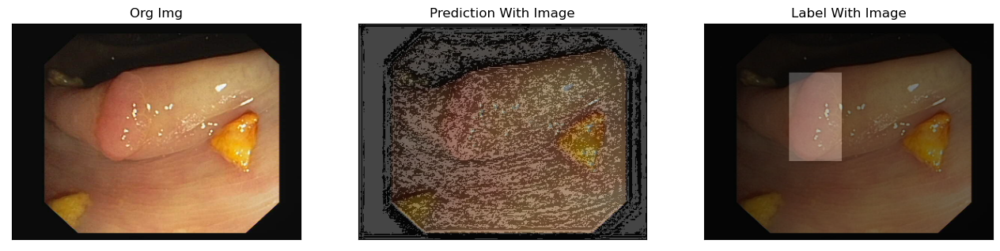

Epoch 0:  20%|██        | 1/5 [00:08<00:33,  8.26s/batch, epoch_iou=0.273, epoch_loss=0.692, iou=0.273, loss=0.692, phase=Training]

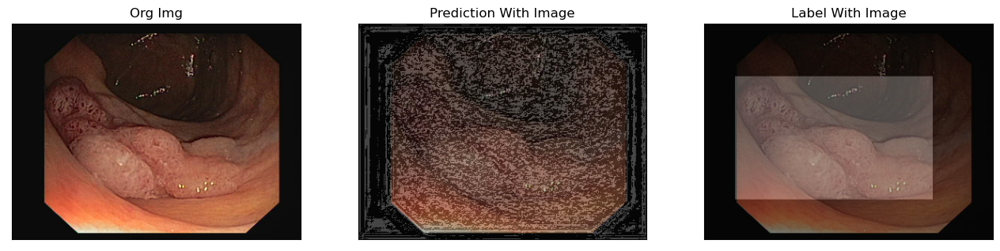

Epoch 0:  40%|████      | 2/5 [00:15<00:22,  7.62s/batch, epoch_iou=0.305, epoch_loss=0.687, iou=0.336, loss=0.682, phase=Training]

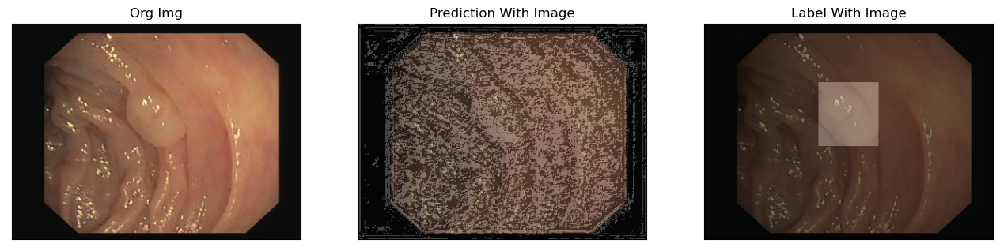

Epoch 0:  60%|██████    | 3/5 [00:23<00:15,  7.70s/batch, epoch_iou=0.329, epoch_loss=0.683, iou=0.379, loss=0.675, phase=Training]

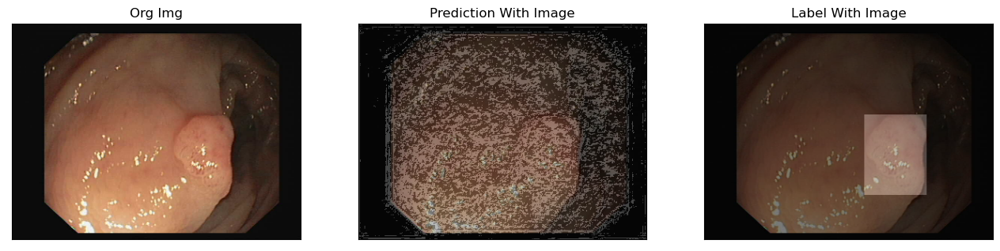

Epoch 0:  80%|████████  | 4/5 [00:31<00:07,  7.76s/batch, epoch_iou=0.341, epoch_loss=0.68, iou=0.376, loss=0.67, phase=Training]  

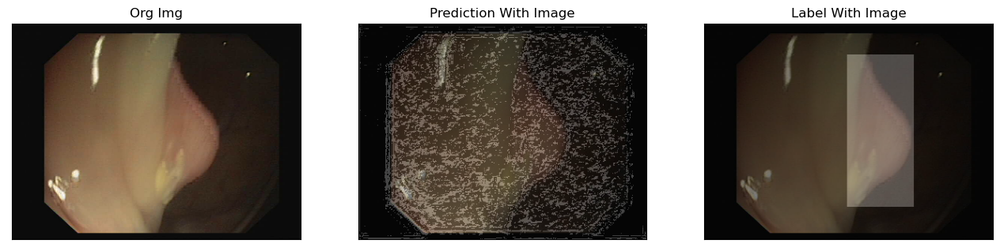

Epoch 0: 100%|██████████| 5/5 [00:38<00:00,  7.69s/batch, epoch_iou=0.35, epoch_loss=0.677, iou=0.387, loss=0.667, phase=Training]
/var/folders/jf/_kgy0y7s2zvg0q5kprq71fz40000gn/T/ipykernel_24885/1161143194.py:74: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_train = df_train.append(train_row, ignore_index=True)


Adjusting learning rate of group 0 to 1.0000e-04.


Epoch 0:   0%|          | 0/5 [00:00<?, ?batch/s]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 0:  40%|████      | 2/5 [00:04<00:07,  2.34s/batch, epoch_iou=0.284, epoch_loss=0.703, iou=0.294, loss=0.702, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 0:  60%|██████    | 3/5 [00:06<00:04,  2.32s/batch, epoch_iou=0.283, epoch_loss=0.703, iou=0.28, loss=0.704, phase=Validation] 

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 0:  80%|████████  | 4/5 [00:09<00:02,  2.29s/batch, epoch_iou=0.281, epoch_loss=0.704, iou=0.274, loss=0.707, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 0: 100%|██████████| 5/5 [00:11<00:00,  2.30s/batch, epoch_iou=0.28, epoch_loss=0.704, iou=0.277, loss=0.705, phase=Validation] 

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])



/var/folders/jf/_kgy0y7s2zvg0q5kprq71fz40000gn/T/ipykernel_24885/1161143194.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_val = df_val.append(val_row, ignore_index=True)


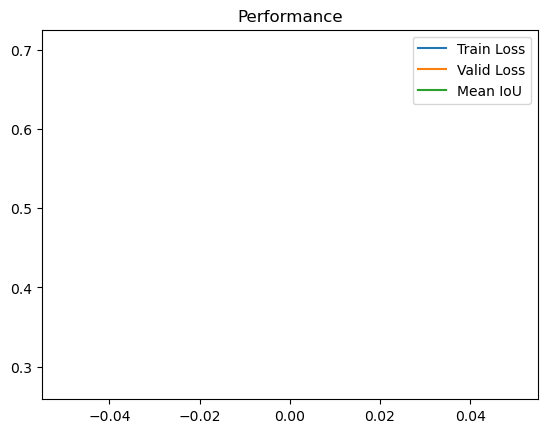

Epoch 1: 100%|██████████| 5/5 [00:35<00:00,  7.05s/batch, epoch_iou=0.451, epoch_loss=0.648, iou=0.456, loss=0.642, phase=Training]
/var/folders/jf/_kgy0y7s2zvg0q5kprq71fz40000gn/T/ipykernel_24885/1161143194.py:74: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_train = df_train.append(train_row, ignore_index=True)


Adjusting learning rate of group 0 to 1.0000e-04.


Epoch 1:  20%|██        | 1/5 [00:02<00:08,  2.15s/batch, epoch_iou=0.296, epoch_loss=0.707, iou=0.296, loss=0.707, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 1:  40%|████      | 2/5 [00:04<00:06,  2.12s/batch, epoch_iou=0.306, epoch_loss=0.706, iou=0.316, loss=0.706, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 1:  60%|██████    | 3/5 [00:06<00:04,  2.14s/batch, epoch_iou=0.304, epoch_loss=0.707, iou=0.299, loss=0.709, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 1:  80%|████████  | 4/5 [00:08<00:02,  2.16s/batch, epoch_iou=0.297, epoch_loss=0.711, iou=0.276, loss=0.72, phase=Validation] 

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 1: 100%|██████████| 5/5 [00:10<00:00,  2.15s/batch, epoch_iou=0.297, epoch_loss=0.71, iou=0.297, loss=0.709, phase=Validation]
/var/folders/jf/_kgy0y7s2zvg0q5kprq71fz40000gn/T/ipykernel_24885/1161143194.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_val = df_val.append(val_row, ignore_index=True)


val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 2:   0%|          | 0/5 [00:00<?, ?batch/s]

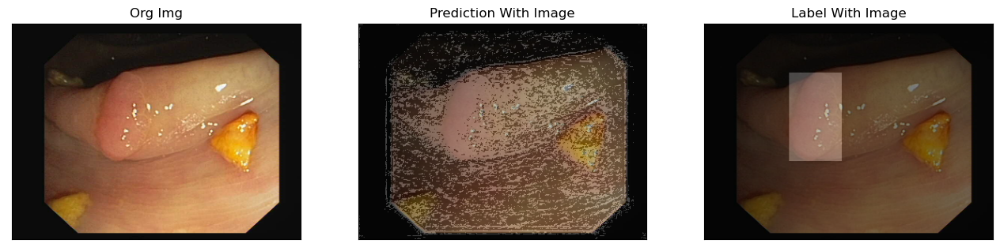

Epoch 2:  20%|██        | 1/5 [00:07<00:29,  7.26s/batch, epoch_iou=0.518, epoch_loss=0.627, iou=0.518, loss=0.627, phase=Training]

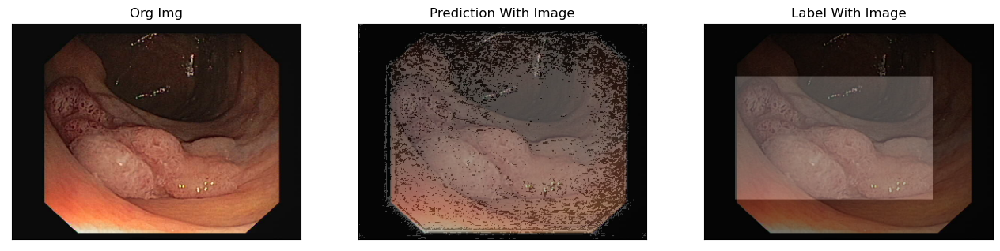

Epoch 2:  40%|████      | 2/5 [00:14<00:21,  7.13s/batch, epoch_iou=0.53, epoch_loss=0.623, iou=0.541, loss=0.619, phase=Training] 

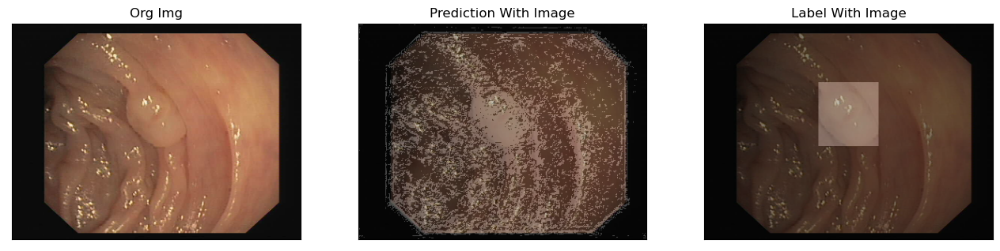

Epoch 2:  60%|██████    | 3/5 [00:21<00:14,  7.14s/batch, epoch_iou=0.53, epoch_loss=0.622, iou=0.532, loss=0.62, phase=Training] 

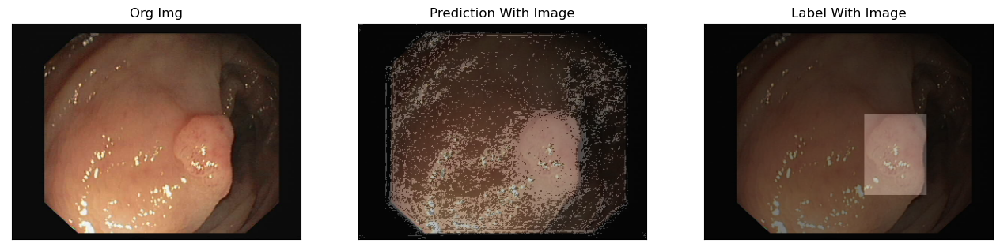

Epoch 2:  80%|████████  | 4/5 [00:28<00:07,  7.13s/batch, epoch_iou=0.534, epoch_loss=0.62, iou=0.546, loss=0.613, phase=Training]

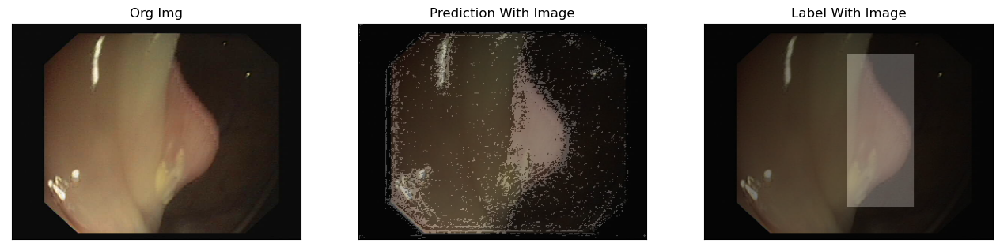

Epoch 2: 100%|██████████| 5/5 [00:35<00:00,  7.09s/batch, epoch_iou=0.536, epoch_loss=0.618, iou=0.54, loss=0.612, phase=Training]
/var/folders/jf/_kgy0y7s2zvg0q5kprq71fz40000gn/T/ipykernel_24885/1161143194.py:74: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_train = df_train.append(train_row, ignore_index=True)


Adjusting learning rate of group 0 to 1.0000e-04.


Epoch 2:  20%|██        | 1/5 [00:02<00:08,  2.15s/batch, epoch_iou=0.421, epoch_loss=0.654, iou=0.421, loss=0.654, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 2:  40%|████      | 2/5 [00:04<00:06,  2.13s/batch, epoch_iou=0.433, epoch_loss=0.653, iou=0.445, loss=0.653, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 2:  60%|██████    | 3/5 [00:06<00:04,  2.11s/batch, epoch_iou=0.431, epoch_loss=0.654, iou=0.427, loss=0.654, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 2:  80%|████████  | 4/5 [00:08<00:02,  2.13s/batch, epoch_iou=0.422, epoch_loss=0.657, iou=0.394, loss=0.669, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 2: 100%|██████████| 5/5 [00:10<00:00,  2.13s/batch, epoch_iou=0.419, epoch_loss=0.659, iou=0.407, loss=0.663, phase=Validation]
/var/folders/jf/_kgy0y7s2zvg0q5kprq71fz40000gn/T/ipykernel_24885/1161143194.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_val = df_val.append(val_row, ignore_index=True)


val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 3: 100%|██████████| 5/5 [00:33<00:00,  6.76s/batch, epoch_iou=0.621, epoch_loss=0.59, iou=0.629, loss=0.585, phase=Training] 
/var/folders/jf/_kgy0y7s2zvg0q5kprq71fz40000gn/T/ipykernel_24885/1161143194.py:74: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_train = df_train.append(train_row, ignore_index=True)


Adjusting learning rate of group 0 to 1.0000e-04.


Epoch 3:  20%|██        | 1/5 [00:02<00:08,  2.18s/batch, epoch_iou=0.511, epoch_loss=0.617, iou=0.511, loss=0.617, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 3:  40%|████      | 2/5 [00:04<00:06,  2.18s/batch, epoch_iou=0.519, epoch_loss=0.619, iou=0.528, loss=0.622, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 3:  60%|██████    | 3/5 [00:06<00:04,  2.16s/batch, epoch_iou=0.523, epoch_loss=0.618, iou=0.531, loss=0.615, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 3:  80%|████████  | 4/5 [00:08<00:02,  2.16s/batch, epoch_iou=0.515, epoch_loss=0.622, iou=0.491, loss=0.634, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 3: 100%|██████████| 5/5 [00:10<00:00,  2.14s/batch, epoch_iou=0.508, epoch_loss=0.624, iou=0.48, loss=0.632, phase=Validation] 
/var/folders/jf/_kgy0y7s2zvg0q5kprq71fz40000gn/T/ipykernel_24885/1161143194.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_val = df_val.append(val_row, ignore_index=True)


val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 4:   0%|          | 0/5 [00:00<?, ?batch/s]

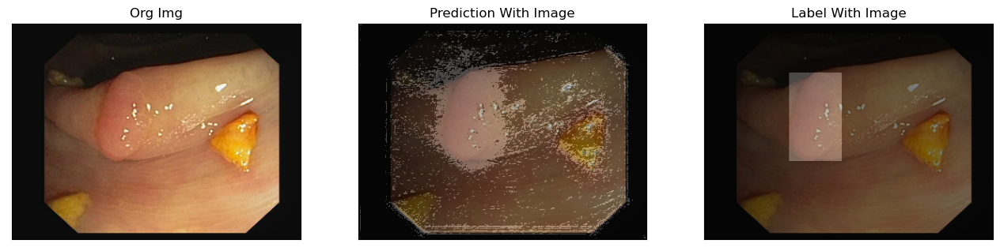

Epoch 4:  20%|██        | 1/5 [00:07<00:28,  7.06s/batch, epoch_iou=0.683, epoch_loss=0.572, iou=0.683, loss=0.572, phase=Training]

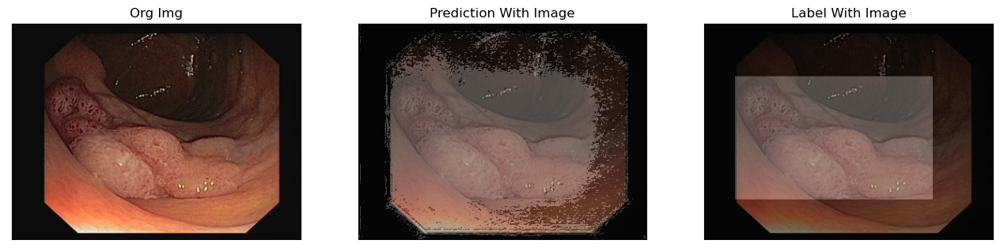

Epoch 4:  40%|████      | 2/5 [00:14<00:21,  7.09s/batch, epoch_iou=0.696, epoch_loss=0.57, iou=0.709, loss=0.567, phase=Training] 

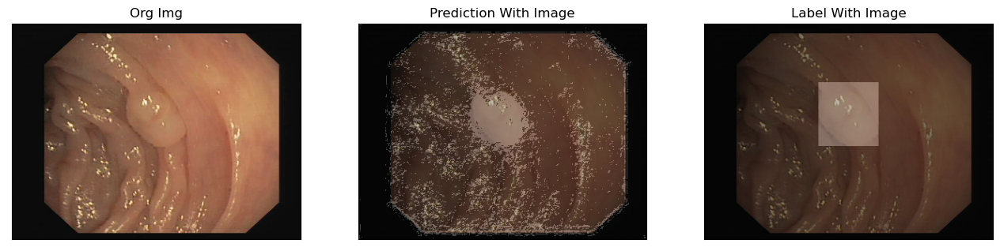

Epoch 4:  60%|██████    | 3/5 [00:21<00:14,  7.09s/batch, epoch_iou=0.701, epoch_loss=0.568, iou=0.712, loss=0.565, phase=Training]

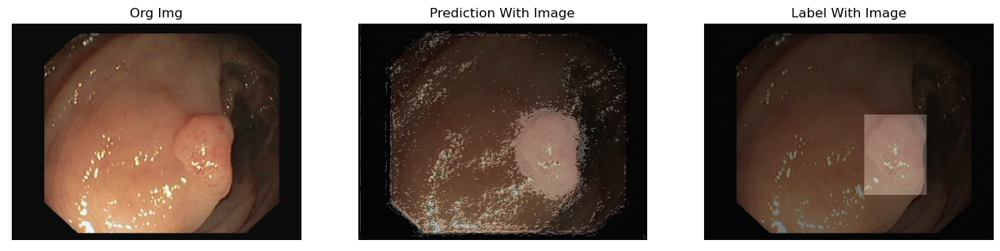

Epoch 4:  80%|████████  | 4/5 [00:28<00:07,  7.12s/batch, epoch_iou=0.698, epoch_loss=0.568, iou=0.689, loss=0.567, phase=Training]

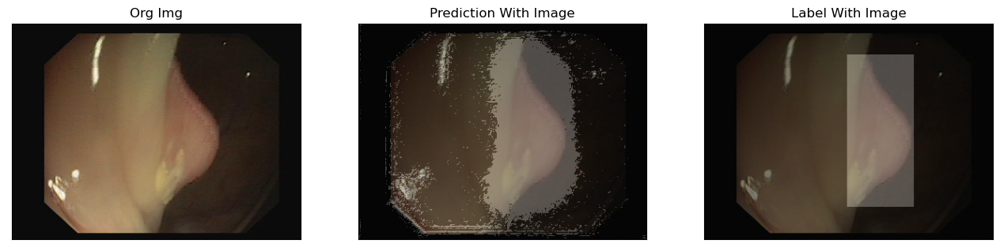

Epoch 4: 100%|██████████| 5/5 [00:35<00:00,  7.08s/batch, epoch_iou=0.699, epoch_loss=0.567, iou=0.704, loss=0.563, phase=Training]
/var/folders/jf/_kgy0y7s2zvg0q5kprq71fz40000gn/T/ipykernel_24885/1161143194.py:74: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_train = df_train.append(train_row, ignore_index=True)


Adjusting learning rate of group 0 to 5.0000e-05.


Epoch 4:  20%|██        | 1/5 [00:02<00:08,  2.19s/batch, epoch_iou=0.595, epoch_loss=0.581, iou=0.595, loss=0.581, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 4:  40%|████      | 2/5 [00:04<00:06,  2.17s/batch, epoch_iou=0.591, epoch_loss=0.586, iou=0.587, loss=0.592, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 4:  60%|██████    | 3/5 [00:06<00:04,  2.15s/batch, epoch_iou=0.601, epoch_loss=0.584, iou=0.621, loss=0.578, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 4:  80%|████████  | 4/5 [00:08<00:02,  2.13s/batch, epoch_iou=0.596, epoch_loss=0.587, iou=0.582, loss=0.598, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 4: 100%|██████████| 5/5 [00:10<00:00,  2.14s/batch, epoch_iou=0.584, epoch_loss=0.591, iou=0.533, loss=0.604, phase=Validation]
/var/folders/jf/_kgy0y7s2zvg0q5kprq71fz40000gn/T/ipykernel_24885/1161143194.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_val = df_val.append(val_row, ignore_index=True)


val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 5: 100%|██████████| 5/5 [00:34<00:00,  6.90s/batch, epoch_iou=0.754, epoch_loss=0.55, iou=0.758, loss=0.548, phase=Training] 
/var/folders/jf/_kgy0y7s2zvg0q5kprq71fz40000gn/T/ipykernel_24885/1161143194.py:74: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_train = df_train.append(train_row, ignore_index=True)


Adjusting learning rate of group 0 to 5.0000e-05.


Epoch 5:  20%|██        | 1/5 [00:02<00:08,  2.12s/batch, epoch_iou=0.615, epoch_loss=0.561, iou=0.615, loss=0.561, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 5:  40%|████      | 2/5 [00:04<00:06,  2.14s/batch, epoch_iou=0.623, epoch_loss=0.563, iou=0.631, loss=0.565, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 5:  60%|██████    | 3/5 [00:06<00:04,  2.18s/batch, epoch_iou=0.636, epoch_loss=0.561, iou=0.663, loss=0.556, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 5:  80%|████████  | 4/5 [00:08<00:02,  2.15s/batch, epoch_iou=0.631, epoch_loss=0.564, iou=0.613, loss=0.575, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 5: 100%|██████████| 5/5 [00:10<00:00,  2.15s/batch, epoch_iou=0.619, epoch_loss=0.566, iou=0.57, loss=0.573, phase=Validation] 

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])



/var/folders/jf/_kgy0y7s2zvg0q5kprq71fz40000gn/T/ipykernel_24885/1161143194.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_val = df_val.append(val_row, ignore_index=True)


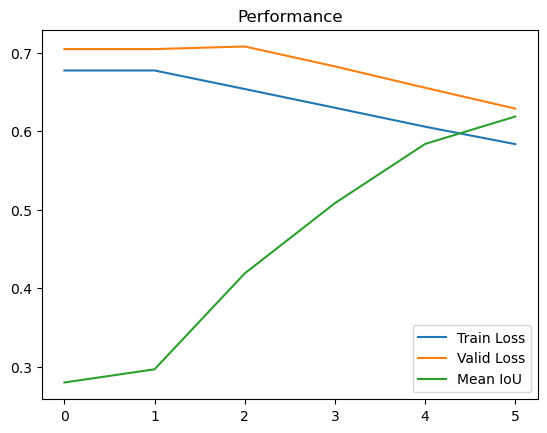

Epoch 6:   0%|          | 0/5 [00:00<?, ?batch/s]

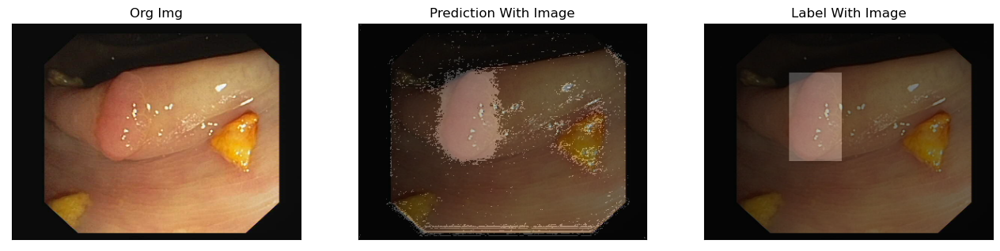

Epoch 6:  20%|██        | 1/5 [00:07<00:28,  7.16s/batch, epoch_iou=0.796, epoch_loss=0.54, iou=0.796, loss=0.54, phase=Training]

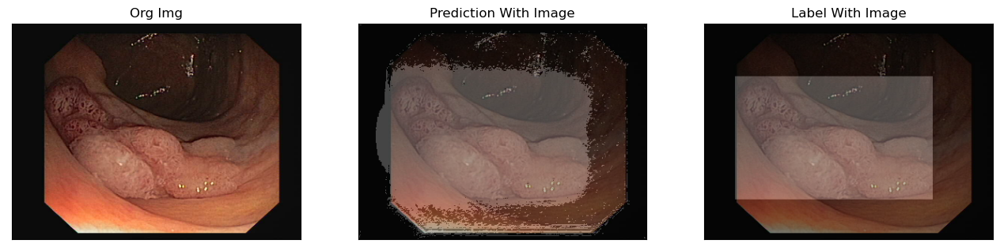

Epoch 6:  40%|████      | 2/5 [00:14<00:21,  7.03s/batch, epoch_iou=0.794, epoch_loss=0.541, iou=0.793, loss=0.541, phase=Training]

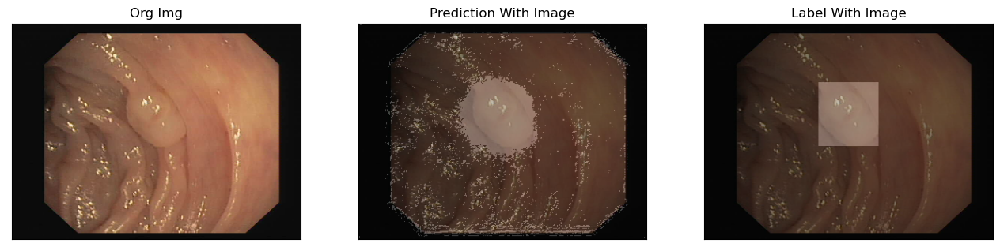

Epoch 6:  60%|██████    | 3/5 [00:21<00:13,  6.99s/batch, epoch_iou=0.8, epoch_loss=0.539, iou=0.81, loss=0.537, phase=Training]   

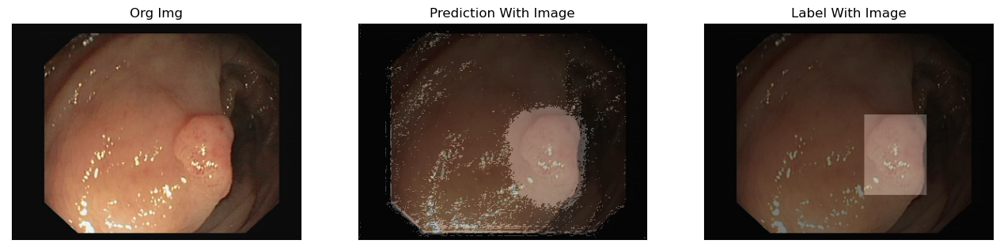

Epoch 6:  80%|████████  | 4/5 [00:28<00:06,  6.98s/batch, epoch_iou=0.792, epoch_loss=0.541, iou=0.77, loss=0.545, phase=Training]

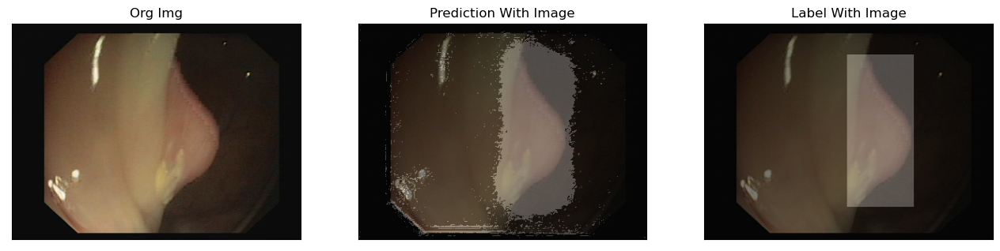

Epoch 6: 100%|██████████| 5/5 [00:35<00:00,  7.01s/batch, epoch_iou=0.791, epoch_loss=0.54, iou=0.784, loss=0.54, phase=Training] 
/var/folders/jf/_kgy0y7s2zvg0q5kprq71fz40000gn/T/ipykernel_24885/1161143194.py:74: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_train = df_train.append(train_row, ignore_index=True)


Adjusting learning rate of group 0 to 5.0000e-05.


Epoch 6:  20%|██        | 1/5 [00:02<00:08,  2.22s/batch, epoch_iou=0.645, epoch_loss=0.551, iou=0.645, loss=0.551, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 6:  40%|████      | 2/5 [00:04<00:06,  2.14s/batch, epoch_iou=0.652, epoch_loss=0.553, iou=0.658, loss=0.556, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 6:  60%|██████    | 3/5 [00:06<00:04,  2.14s/batch, epoch_iou=0.665, epoch_loss=0.551, iou=0.692, loss=0.546, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 6:  80%|████████  | 4/5 [00:08<00:02,  2.14s/batch, epoch_iou=0.656, epoch_loss=0.555, iou=0.626, loss=0.567, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 6: 100%|██████████| 5/5 [00:10<00:00,  2.14s/batch, epoch_iou=0.642, epoch_loss=0.557, iou=0.588, loss=0.563, phase=Validation]
/var/folders/jf/_kgy0y7s2zvg0q5kprq71fz40000gn/T/ipykernel_24885/1161143194.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_val = df_val.append(val_row, ignore_index=True)


val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 7: 100%|██████████| 5/5 [00:35<00:00,  7.16s/batch, epoch_iou=0.818, epoch_loss=0.532, iou=0.812, loss=0.532, phase=Training]
/var/folders/jf/_kgy0y7s2zvg0q5kprq71fz40000gn/T/ipykernel_24885/1161143194.py:74: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_train = df_train.append(train_row, ignore_index=True)


Adjusting learning rate of group 0 to 5.0000e-05.


Epoch 7:  20%|██        | 1/5 [00:02<00:11,  2.77s/batch, epoch_iou=0.66, epoch_loss=0.543, iou=0.66, loss=0.543, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 7:  40%|████      | 2/5 [00:05<00:07,  2.58s/batch, epoch_iou=0.662, epoch_loss=0.546, iou=0.664, loss=0.549, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 7:  60%|██████    | 3/5 [00:07<00:05,  2.51s/batch, epoch_iou=0.672, epoch_loss=0.544, iou=0.691, loss=0.54, phase=Validation] 

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 7:  80%|████████  | 4/5 [00:09<00:02,  2.44s/batch, epoch_iou=0.664, epoch_loss=0.548, iou=0.641, loss=0.559, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 7: 100%|██████████| 5/5 [00:12<00:00,  2.46s/batch, epoch_iou=0.653, epoch_loss=0.549, iou=0.607, loss=0.554, phase=Validation]
/var/folders/jf/_kgy0y7s2zvg0q5kprq71fz40000gn/T/ipykernel_24885/1161143194.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_val = df_val.append(val_row, ignore_index=True)


val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 8:   0%|          | 0/5 [00:00<?, ?batch/s]

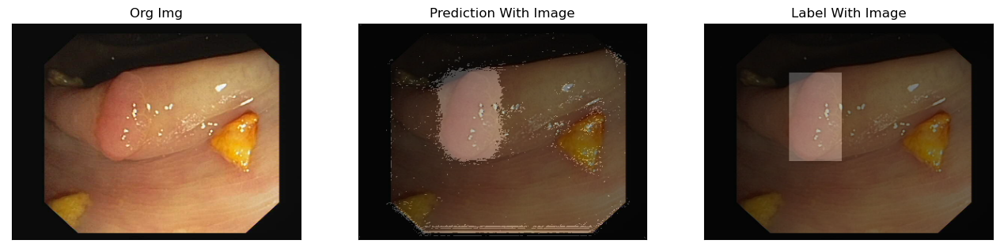

Epoch 8:  20%|██        | 1/5 [00:09<00:36,  9.13s/batch, epoch_iou=0.848, epoch_loss=0.524, iou=0.848, loss=0.524, phase=Training]

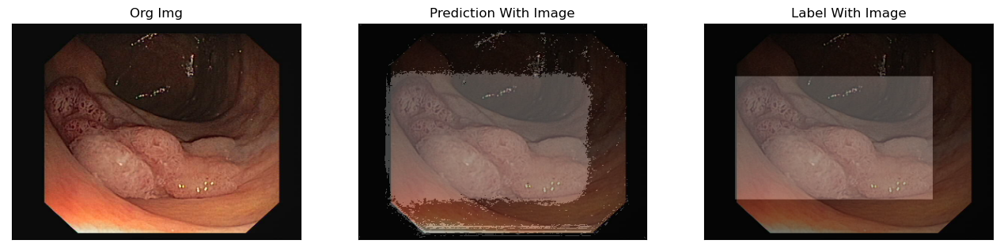

Epoch 8:  40%|████      | 2/5 [00:17<00:26,  8.73s/batch, epoch_iou=0.847, epoch_loss=0.524, iou=0.846, loss=0.524, phase=Training]

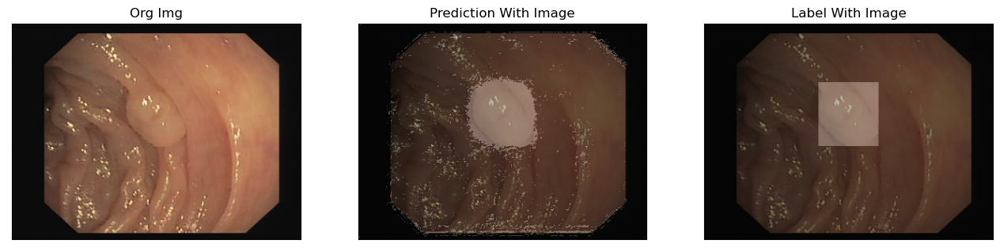

Epoch 8:  60%|██████    | 3/5 [00:25<00:16,  8.31s/batch, epoch_iou=0.854, epoch_loss=0.522, iou=0.869, loss=0.519, phase=Training]

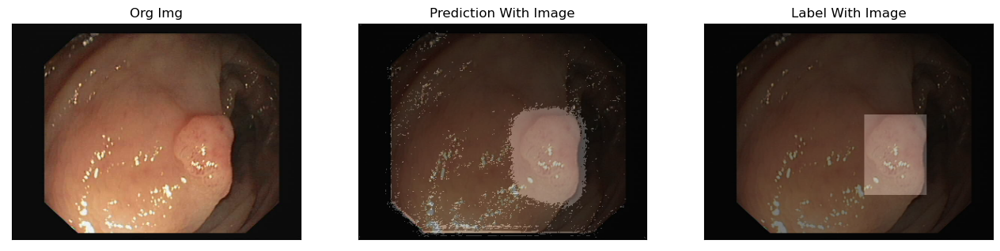

Epoch 8:  80%|████████  | 4/5 [00:32<00:07,  7.93s/batch, epoch_iou=0.846, epoch_loss=0.525, iou=0.82, loss=0.532, phase=Training] 

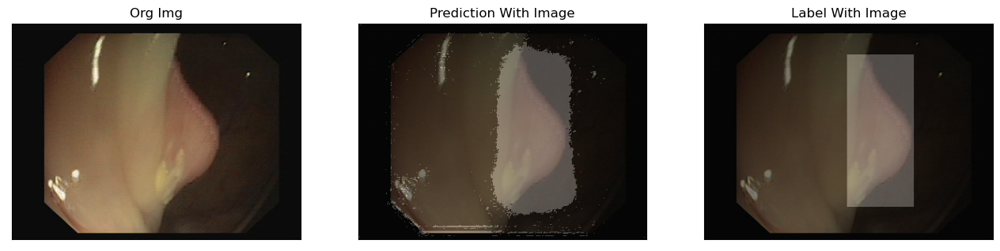

Epoch 8: 100%|██████████| 5/5 [00:39<00:00,  8.00s/batch, epoch_iou=0.845, epoch_loss=0.525, iou=0.841, loss=0.525, phase=Training]
/var/folders/jf/_kgy0y7s2zvg0q5kprq71fz40000gn/T/ipykernel_24885/1161143194.py:74: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_train = df_train.append(train_row, ignore_index=True)


Adjusting learning rate of group 0 to 5.0000e-05.


Epoch 8:  20%|██        | 1/5 [00:02<00:09,  2.30s/batch, epoch_iou=0.674, epoch_loss=0.536, iou=0.674, loss=0.536, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 8:  40%|████      | 2/5 [00:04<00:06,  2.28s/batch, epoch_iou=0.669, epoch_loss=0.54, iou=0.664, loss=0.543, phase=Validation] 

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 8:  60%|██████    | 3/5 [00:06<00:04,  2.27s/batch, epoch_iou=0.682, epoch_loss=0.537, iou=0.709, loss=0.532, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 8:  80%|████████  | 4/5 [00:09<00:02,  2.25s/batch, epoch_iou=0.672, epoch_loss=0.542, iou=0.642, loss=0.555, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 8: 100%|██████████| 5/5 [00:11<00:00,  2.26s/batch, epoch_iou=0.66, epoch_loss=0.543, iou=0.61, loss=0.548, phase=Validation]  
/var/folders/jf/_kgy0y7s2zvg0q5kprq71fz40000gn/T/ipykernel_24885/1161143194.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_val = df_val.append(val_row, ignore_index=True)


val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 9: 100%|██████████| 5/5 [00:35<00:00,  7.03s/batch, epoch_iou=0.862, epoch_loss=0.519, iou=0.852, loss=0.52, phase=Training] 
/var/folders/jf/_kgy0y7s2zvg0q5kprq71fz40000gn/T/ipykernel_24885/1161143194.py:74: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_train = df_train.append(train_row, ignore_index=True)


Adjusting learning rate of group 0 to 2.5000e-05.


Epoch 9:  20%|██        | 1/5 [00:02<00:09,  2.28s/batch, epoch_iou=0.694, epoch_loss=0.531, iou=0.694, loss=0.531, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 9:  40%|████      | 2/5 [00:04<00:06,  2.23s/batch, epoch_iou=0.687, epoch_loss=0.534, iou=0.68, loss=0.538, phase=Validation] 

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 9:  60%|██████    | 3/5 [00:06<00:04,  2.22s/batch, epoch_iou=0.696, epoch_loss=0.533, iou=0.715, loss=0.53, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 9:  80%|████████  | 4/5 [00:08<00:02,  2.23s/batch, epoch_iou=0.685, epoch_loss=0.537, iou=0.653, loss=0.55, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 9: 100%|██████████| 5/5 [00:11<00:00,  2.22s/batch, epoch_iou=0.673, epoch_loss=0.538, iou=0.622, loss=0.544, phase=Validation]
/var/folders/jf/_kgy0y7s2zvg0q5kprq71fz40000gn/T/ipykernel_24885/1161143194.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_val = df_val.append(val_row, ignore_index=True)


val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 10:   0%|          | 0/5 [00:00<?, ?batch/s]

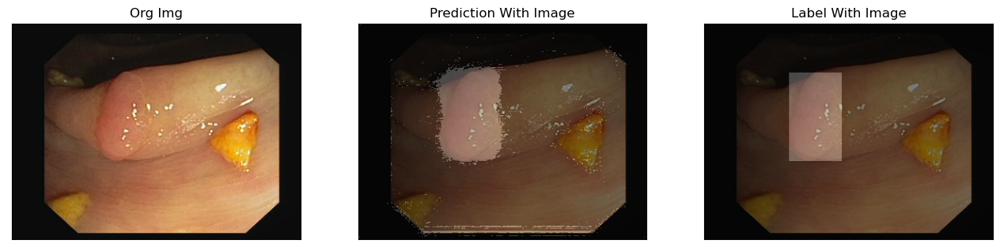

Epoch 10:  20%|██        | 1/5 [00:07<00:28,  7.14s/batch, epoch_iou=0.881, epoch_loss=0.512, iou=0.881, loss=0.512, phase=Training]

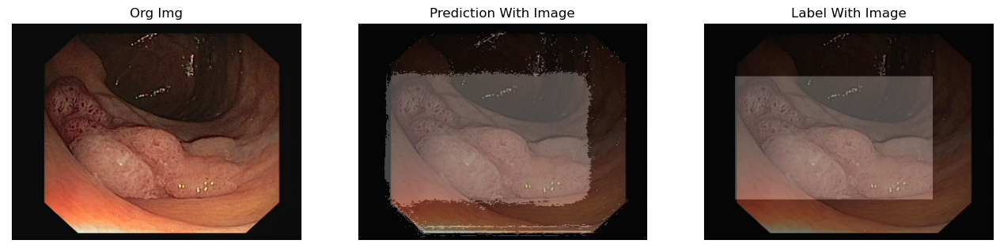

Epoch 10:  40%|████      | 2/5 [00:14<00:21,  7.05s/batch, epoch_iou=0.878, epoch_loss=0.512, iou=0.875, loss=0.513, phase=Training]

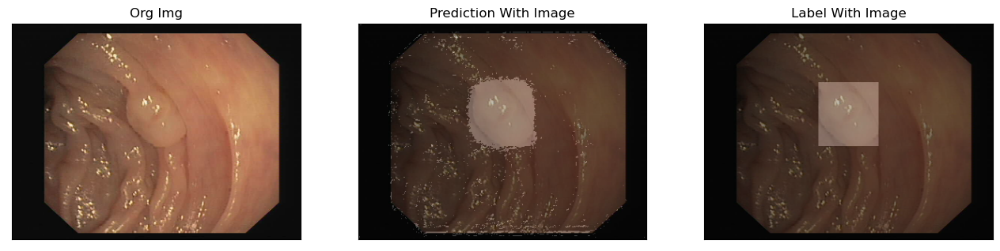

Epoch 10:  60%|██████    | 3/5 [00:21<00:14,  7.18s/batch, epoch_iou=0.885, epoch_loss=0.511, iou=0.897, loss=0.508, phase=Training]

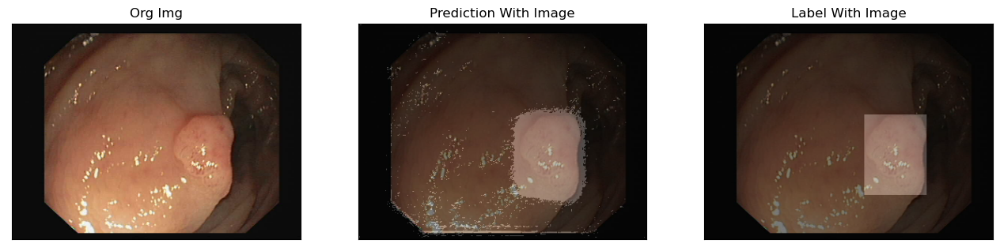

Epoch 10:  80%|████████  | 4/5 [00:28<00:07,  7.14s/batch, epoch_iou=0.876, epoch_loss=0.514, iou=0.85, loss=0.522, phase=Training] 

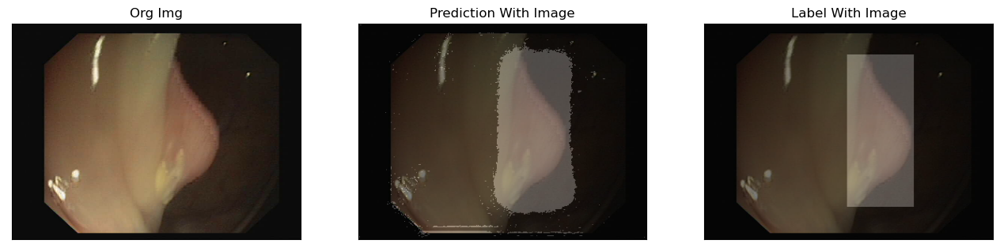

Epoch 10: 100%|██████████| 5/5 [00:35<00:00,  7.10s/batch, epoch_iou=0.874, epoch_loss=0.514, iou=0.867, loss=0.516, phase=Training]
/var/folders/jf/_kgy0y7s2zvg0q5kprq71fz40000gn/T/ipykernel_24885/1161143194.py:74: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_train = df_train.append(train_row, ignore_index=True)


Adjusting learning rate of group 0 to 2.5000e-05.


Epoch 10:  20%|██        | 1/5 [00:02<00:08,  2.24s/batch, epoch_iou=0.704, epoch_loss=0.531, iou=0.704, loss=0.531, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 10:  40%|████      | 2/5 [00:04<00:06,  2.20s/batch, epoch_iou=0.692, epoch_loss=0.534, iou=0.681, loss=0.537, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 10:  60%|██████    | 3/5 [00:06<00:04,  2.22s/batch, epoch_iou=0.7, epoch_loss=0.533, iou=0.716, loss=0.53, phase=Validation]   

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 10:  80%|████████  | 4/5 [00:08<00:02,  2.21s/batch, epoch_iou=0.687, epoch_loss=0.538, iou=0.646, loss=0.553, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 10: 100%|██████████| 5/5 [00:11<00:00,  2.21s/batch, epoch_iou=0.673, epoch_loss=0.539, iou=0.618, loss=0.546, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])



/var/folders/jf/_kgy0y7s2zvg0q5kprq71fz40000gn/T/ipykernel_24885/1161143194.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_val = df_val.append(val_row, ignore_index=True)


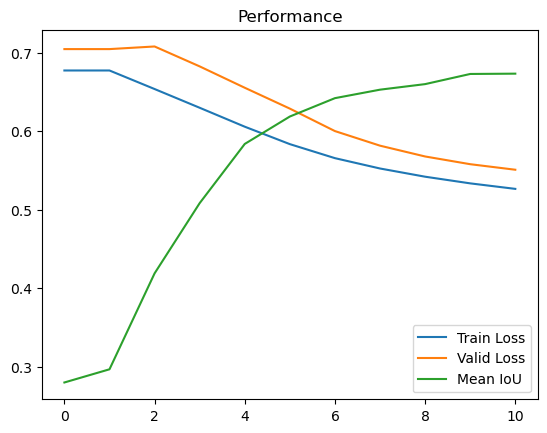

Epoch 11: 100%|██████████| 5/5 [00:34<00:00,  6.88s/batch, epoch_iou=0.883, epoch_loss=0.511, iou=0.875, loss=0.513, phase=Training]
/var/folders/jf/_kgy0y7s2zvg0q5kprq71fz40000gn/T/ipykernel_24885/1161143194.py:74: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_train = df_train.append(train_row, ignore_index=True)


Adjusting learning rate of group 0 to 2.5000e-05.


Epoch 11:  20%|██        | 1/5 [00:02<00:08,  2.25s/batch, epoch_iou=0.708, epoch_loss=0.531, iou=0.708, loss=0.531, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 11:  40%|████      | 2/5 [00:04<00:06,  2.21s/batch, epoch_iou=0.694, epoch_loss=0.535, iou=0.681, loss=0.539, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 11:  60%|██████    | 3/5 [00:06<00:04,  2.21s/batch, epoch_iou=0.7, epoch_loss=0.533, iou=0.71, loss=0.531, phase=Validation]   

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 11:  80%|████████  | 4/5 [00:08<00:02,  2.21s/batch, epoch_iou=0.685, epoch_loss=0.539, iou=0.641, loss=0.556, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 11: 100%|██████████| 5/5 [00:11<00:00,  2.21s/batch, epoch_iou=0.672, epoch_loss=0.541, iou=0.619, loss=0.547, phase=Validation]
/var/folders/jf/_kgy0y7s2zvg0q5kprq71fz40000gn/T/ipykernel_24885/1161143194.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_val = df_val.append(val_row, ignore_index=True)


val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 12:   0%|          | 0/5 [00:00<?, ?batch/s]

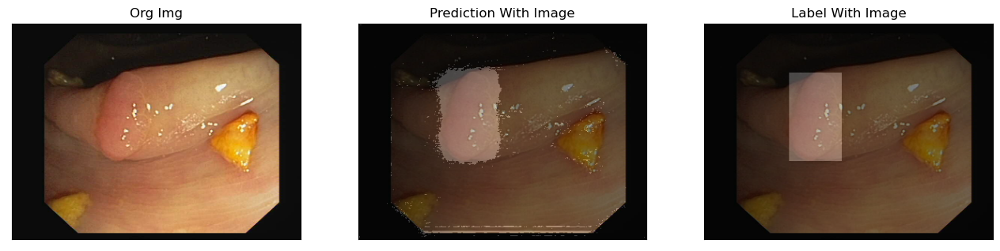

Epoch 12:  20%|██        | 1/5 [00:07<00:28,  7.08s/batch, epoch_iou=0.897, epoch_loss=0.506, iou=0.897, loss=0.506, phase=Training]

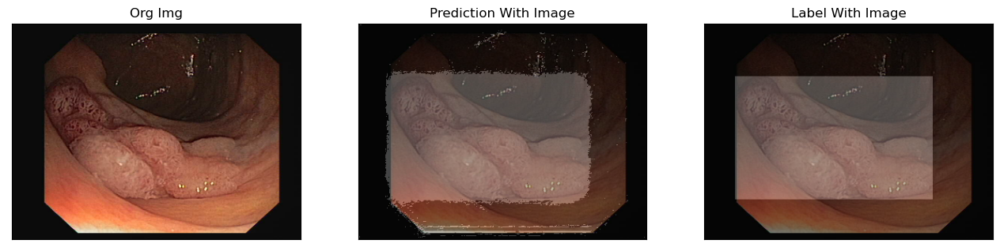

Epoch 12:  40%|████      | 2/5 [00:14<00:20,  7.00s/batch, epoch_iou=0.894, epoch_loss=0.507, iou=0.891, loss=0.507, phase=Training]

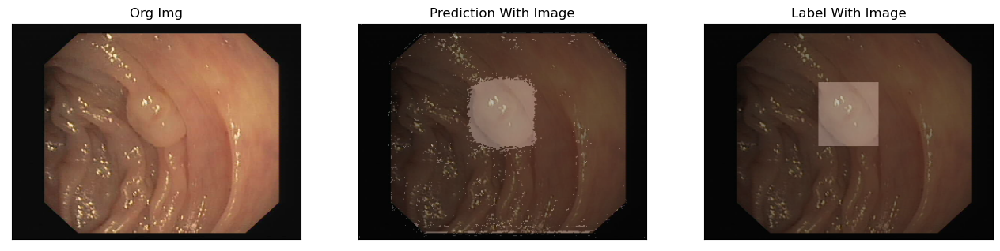

Epoch 12:  60%|██████    | 3/5 [00:21<00:13,  6.99s/batch, epoch_iou=0.899, epoch_loss=0.505, iou=0.911, loss=0.503, phase=Training]

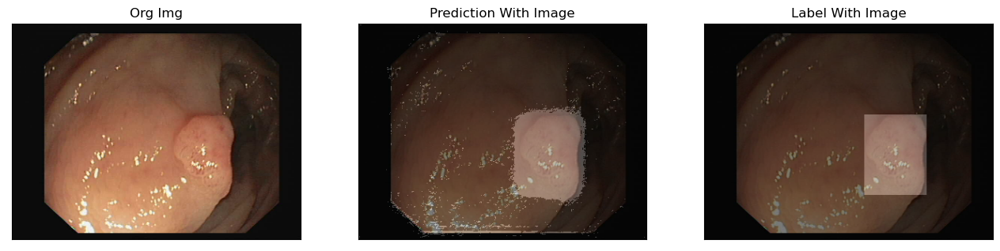

Epoch 12:  80%|████████  | 4/5 [00:28<00:07,  7.04s/batch, epoch_iou=0.891, epoch_loss=0.508, iou=0.865, loss=0.517, phase=Training]

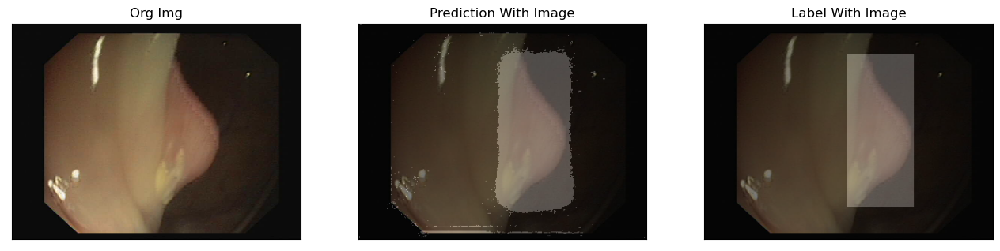

Epoch 12: 100%|██████████| 5/5 [00:35<00:00,  7.05s/batch, epoch_iou=0.889, epoch_loss=0.509, iou=0.881, loss=0.511, phase=Training]
/var/folders/jf/_kgy0y7s2zvg0q5kprq71fz40000gn/T/ipykernel_24885/1161143194.py:74: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_train = df_train.append(train_row, ignore_index=True)


Adjusting learning rate of group 0 to 2.5000e-05.


Epoch 12:  20%|██        | 1/5 [00:02<00:09,  2.27s/batch, epoch_iou=0.709, epoch_loss=0.53, iou=0.709, loss=0.53, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 12:  40%|████      | 2/5 [00:04<00:06,  2.22s/batch, epoch_iou=0.697, epoch_loss=0.534, iou=0.685, loss=0.537, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 12:  60%|██████    | 3/5 [00:06<00:04,  2.21s/batch, epoch_iou=0.702, epoch_loss=0.533, iou=0.711, loss=0.53, phase=Validation] 

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 12:  80%|████████  | 4/5 [00:08<00:02,  2.22s/batch, epoch_iou=0.688, epoch_loss=0.538, iou=0.646, loss=0.555, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 12: 100%|██████████| 5/5 [00:11<00:00,  2.23s/batch, epoch_iou=0.675, epoch_loss=0.54, iou=0.622, loss=0.547, phase=Validation] 
/var/folders/jf/_kgy0y7s2zvg0q5kprq71fz40000gn/T/ipykernel_24885/1161143194.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_val = df_val.append(val_row, ignore_index=True)


val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 13: 100%|██████████| 5/5 [00:34<00:00,  6.93s/batch, epoch_iou=0.895, epoch_loss=0.506, iou=0.889, loss=0.508, phase=Training]
/var/folders/jf/_kgy0y7s2zvg0q5kprq71fz40000gn/T/ipykernel_24885/1161143194.py:74: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_train = df_train.append(train_row, ignore_index=True)


Adjusting learning rate of group 0 to 2.5000e-05.


Epoch 13:  20%|██        | 1/5 [00:02<00:08,  2.25s/batch, epoch_iou=0.712, epoch_loss=0.529, iou=0.712, loss=0.529, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 13:  40%|████      | 2/5 [00:04<00:06,  2.22s/batch, epoch_iou=0.699, epoch_loss=0.532, iou=0.687, loss=0.536, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 13:  60%|██████    | 3/5 [00:06<00:04,  2.22s/batch, epoch_iou=0.703, epoch_loss=0.532, iou=0.711, loss=0.53, phase=Validation] 

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 13:  80%|████████  | 4/5 [00:08<00:02,  2.23s/batch, epoch_iou=0.689, epoch_loss=0.537, iou=0.648, loss=0.554, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 13: 100%|██████████| 5/5 [00:11<00:00,  2.22s/batch, epoch_iou=0.677, epoch_loss=0.539, iou=0.628, loss=0.545, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])



/var/folders/jf/_kgy0y7s2zvg0q5kprq71fz40000gn/T/ipykernel_24885/1161143194.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_val = df_val.append(val_row, ignore_index=True)
Epoch 14:   0%|          | 0/5 [00:00<?, ?batch/s]

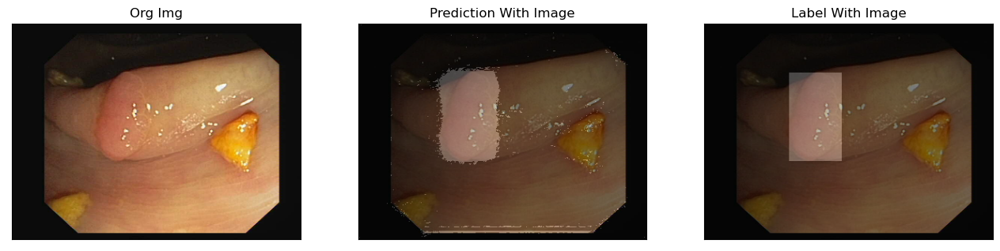

Epoch 14:  20%|██        | 1/5 [00:07<00:29,  7.26s/batch, epoch_iou=0.909, epoch_loss=0.501, iou=0.909, loss=0.501, phase=Training]

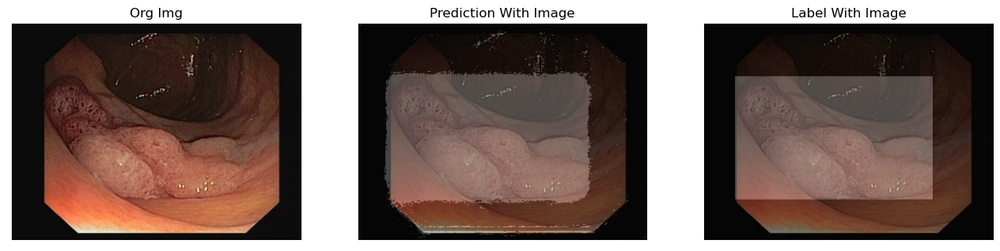

Epoch 14:  40%|████      | 2/5 [00:14<00:21,  7.15s/batch, epoch_iou=0.907, epoch_loss=0.502, iou=0.905, loss=0.502, phase=Training]

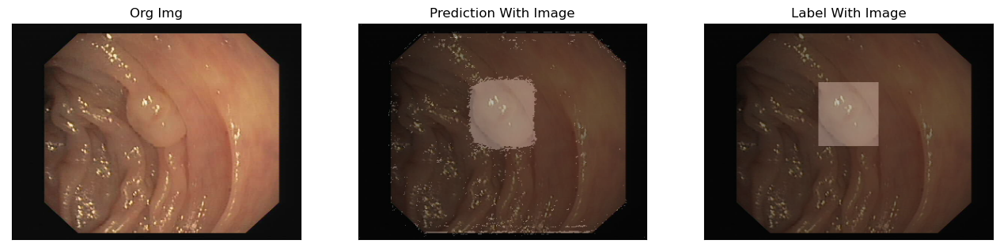

Epoch 14:  60%|██████    | 3/5 [00:21<00:14,  7.03s/batch, epoch_iou=0.911, epoch_loss=0.501, iou=0.92, loss=0.498, phase=Training] 

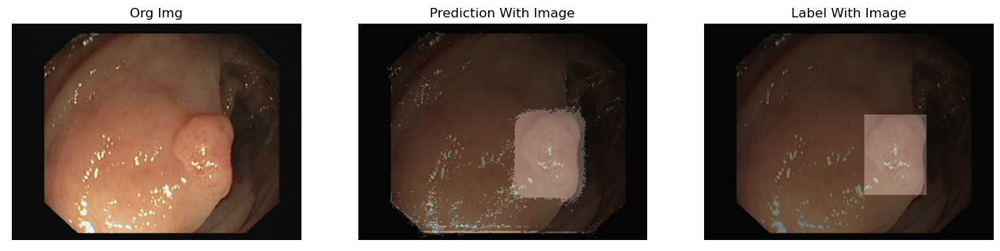

Epoch 14:  80%|████████  | 4/5 [00:28<00:07,  7.03s/batch, epoch_iou=0.903, epoch_loss=0.504, iou=0.877, loss=0.513, phase=Training]

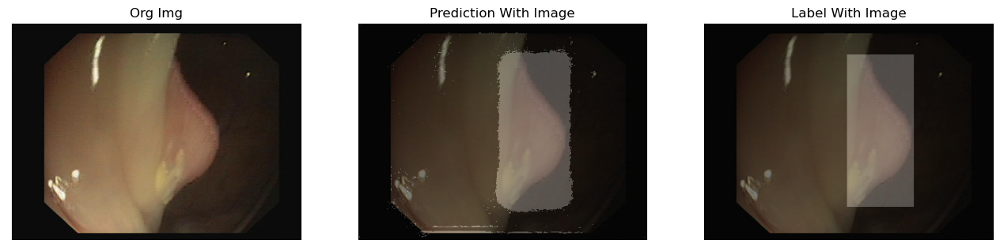

Epoch 14: 100%|██████████| 5/5 [00:35<00:00,  7.08s/batch, epoch_iou=0.901, epoch_loss=0.504, iou=0.894, loss=0.506, phase=Training]
/var/folders/jf/_kgy0y7s2zvg0q5kprq71fz40000gn/T/ipykernel_24885/1161143194.py:74: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_train = df_train.append(train_row, ignore_index=True)


Adjusting learning rate of group 0 to 1.2500e-05.


Epoch 14:  20%|██        | 1/5 [00:02<00:08,  2.23s/batch, epoch_iou=0.715, epoch_loss=0.527, iou=0.715, loss=0.527, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 14:  40%|████      | 2/5 [00:04<00:06,  2.22s/batch, epoch_iou=0.701, epoch_loss=0.531, iou=0.687, loss=0.535, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 14:  60%|██████    | 3/5 [00:06<00:04,  2.21s/batch, epoch_iou=0.706, epoch_loss=0.53, iou=0.715, loss=0.528, phase=Validation] 

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 14:  80%|████████  | 4/5 [00:08<00:02,  2.23s/batch, epoch_iou=0.691, epoch_loss=0.536, iou=0.648, loss=0.553, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 14: 100%|██████████| 5/5 [00:11<00:00,  2.22s/batch, epoch_iou=0.679, epoch_loss=0.538, iou=0.628, loss=0.544, phase=Validation]
/var/folders/jf/_kgy0y7s2zvg0q5kprq71fz40000gn/T/ipykernel_24885/1161143194.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_val = df_val.append(val_row, ignore_index=True)


val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 15: 100%|██████████| 5/5 [00:35<00:00,  7.18s/batch, epoch_iou=0.906, epoch_loss=0.502, iou=0.9, loss=0.505, phase=Training]  
/var/folders/jf/_kgy0y7s2zvg0q5kprq71fz40000gn/T/ipykernel_24885/1161143194.py:74: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_train = df_train.append(train_row, ignore_index=True)


Adjusting learning rate of group 0 to 1.2500e-05.


Epoch 15:  20%|██        | 1/5 [00:02<00:09,  2.25s/batch, epoch_iou=0.715, epoch_loss=0.527, iou=0.715, loss=0.527, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 15:  40%|████      | 2/5 [00:04<00:06,  2.27s/batch, epoch_iou=0.702, epoch_loss=0.531, iou=0.69, loss=0.535, phase=Validation] 

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 15:  60%|██████    | 3/5 [00:06<00:04,  2.26s/batch, epoch_iou=0.706, epoch_loss=0.53, iou=0.713, loss=0.529, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 15:  80%|████████  | 4/5 [00:09<00:02,  2.25s/batch, epoch_iou=0.692, epoch_loss=0.536, iou=0.648, loss=0.553, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 15: 100%|██████████| 5/5 [00:11<00:00,  2.26s/batch, epoch_iou=0.68, epoch_loss=0.537, iou=0.632, loss=0.543, phase=Validation] 

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])



/var/folders/jf/_kgy0y7s2zvg0q5kprq71fz40000gn/T/ipykernel_24885/1161143194.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_val = df_val.append(val_row, ignore_index=True)


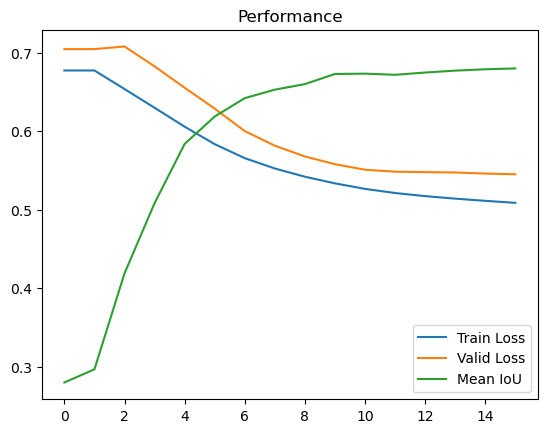

Epoch 16:   0%|          | 0/5 [00:00<?, ?batch/s]

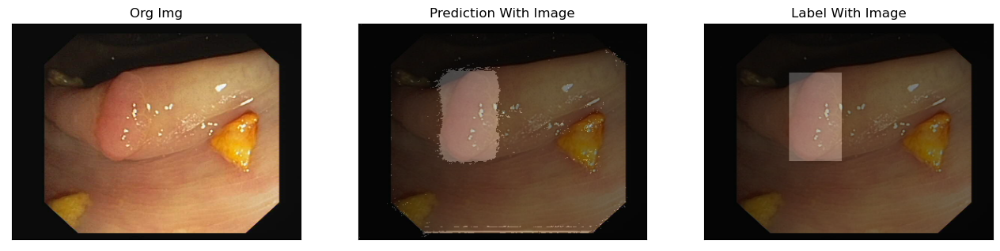

Epoch 16:  20%|██        | 1/5 [00:07<00:29,  7.27s/batch, epoch_iou=0.918, epoch_loss=0.498, iou=0.918, loss=0.498, phase=Training]

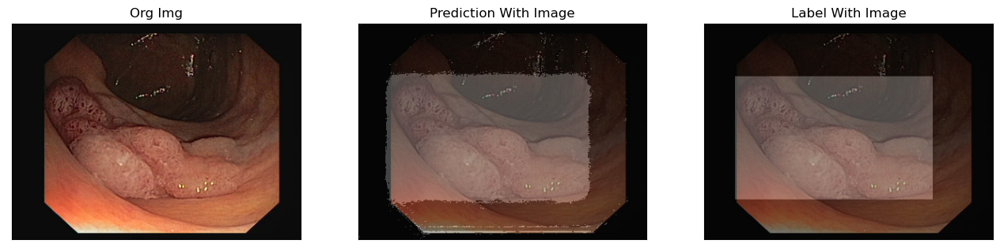

Epoch 16:  40%|████      | 2/5 [00:15<00:22,  7.50s/batch, epoch_iou=0.916, epoch_loss=0.498, iou=0.914, loss=0.499, phase=Training]

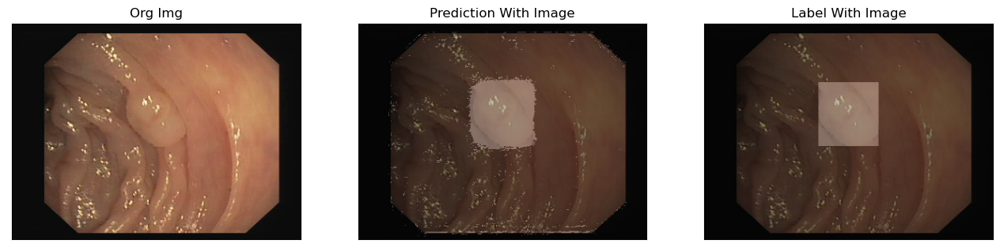

Epoch 16:  60%|██████    | 3/5 [00:22<00:14,  7.27s/batch, epoch_iou=0.92, epoch_loss=0.497, iou=0.928, loss=0.495, phase=Training] 

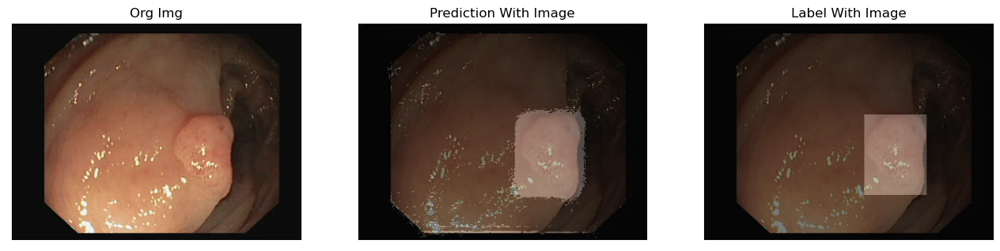

Epoch 16:  80%|████████  | 4/5 [00:29<00:07,  7.21s/batch, epoch_iou=0.912, epoch_loss=0.5, iou=0.887, loss=0.51, phase=Training]  

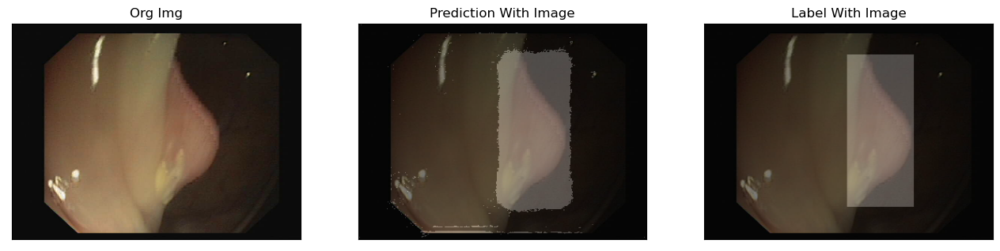

Epoch 16: 100%|██████████| 5/5 [00:36<00:00,  7.22s/batch, epoch_iou=0.91, epoch_loss=0.501, iou=0.902, loss=0.504, phase=Training]
/var/folders/jf/_kgy0y7s2zvg0q5kprq71fz40000gn/T/ipykernel_24885/1161143194.py:74: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_train = df_train.append(train_row, ignore_index=True)


Adjusting learning rate of group 0 to 1.2500e-05.


Epoch 16:  20%|██        | 1/5 [00:02<00:08,  2.24s/batch, epoch_iou=0.714, epoch_loss=0.527, iou=0.714, loss=0.527, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 16:  40%|████      | 2/5 [00:04<00:06,  2.25s/batch, epoch_iou=0.702, epoch_loss=0.531, iou=0.69, loss=0.535, phase=Validation] 

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 16:  60%|██████    | 3/5 [00:06<00:04,  2.26s/batch, epoch_iou=0.705, epoch_loss=0.53, iou=0.711, loss=0.529, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 16:  80%|████████  | 4/5 [00:09<00:02,  2.25s/batch, epoch_iou=0.691, epoch_loss=0.536, iou=0.647, loss=0.554, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 16: 100%|██████████| 5/5 [00:11<00:00,  2.25s/batch, epoch_iou=0.679, epoch_loss=0.538, iou=0.631, loss=0.544, phase=Validation]
/var/folders/jf/_kgy0y7s2zvg0q5kprq71fz40000gn/T/ipykernel_24885/1161143194.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_val = df_val.append(val_row, ignore_index=True)


val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 17: 100%|██████████| 5/5 [00:35<00:00,  7.02s/batch, epoch_iou=0.912, epoch_loss=0.5, iou=0.905, loss=0.502, phase=Training]  
/var/folders/jf/_kgy0y7s2zvg0q5kprq71fz40000gn/T/ipykernel_24885/1161143194.py:74: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_train = df_train.append(train_row, ignore_index=True)


Adjusting learning rate of group 0 to 1.2500e-05.


Epoch 17:  20%|██        | 1/5 [00:02<00:09,  2.27s/batch, epoch_iou=0.716, epoch_loss=0.527, iou=0.716, loss=0.527, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 17:  40%|████      | 2/5 [00:04<00:06,  2.23s/batch, epoch_iou=0.703, epoch_loss=0.531, iou=0.69, loss=0.535, phase=Validation] 

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 17:  60%|██████    | 3/5 [00:06<00:04,  2.24s/batch, epoch_iou=0.706, epoch_loss=0.53, iou=0.711, loss=0.528, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 17:  80%|████████  | 4/5 [00:09<00:02,  2.24s/batch, epoch_iou=0.691, epoch_loss=0.536, iou=0.648, loss=0.554, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 17: 100%|██████████| 5/5 [00:11<00:00,  2.24s/batch, epoch_iou=0.68, epoch_loss=0.537, iou=0.633, loss=0.543, phase=Validation] 
/var/folders/jf/_kgy0y7s2zvg0q5kprq71fz40000gn/T/ipykernel_24885/1161143194.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_val = df_val.append(val_row, ignore_index=True)


val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 18:   0%|          | 0/5 [00:00<?, ?batch/s]

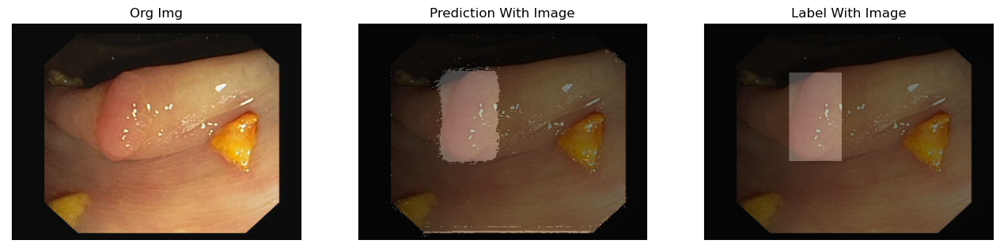

Epoch 18:  20%|██        | 1/5 [00:07<00:28,  7.08s/batch, epoch_iou=0.922, epoch_loss=0.495, iou=0.922, loss=0.495, phase=Training]

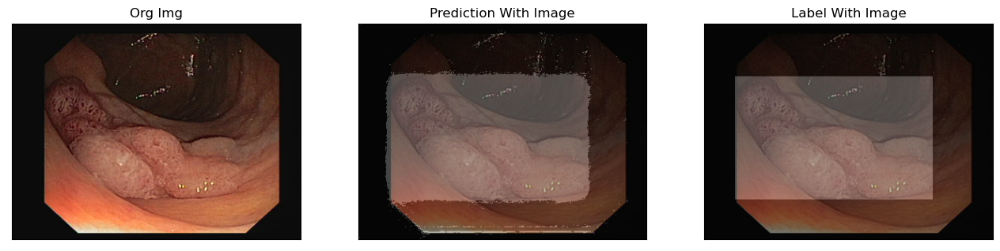

Epoch 18:  40%|████      | 2/5 [00:14<00:21,  7.07s/batch, epoch_iou=0.921, epoch_loss=0.496, iou=0.919, loss=0.497, phase=Training]

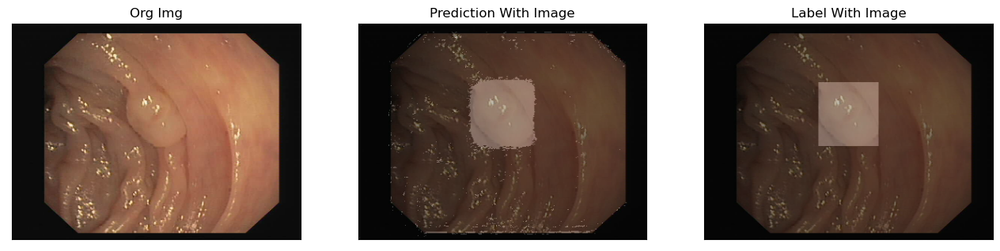

Epoch 18:  60%|██████    | 3/5 [00:21<00:14,  7.08s/batch, epoch_iou=0.925, epoch_loss=0.495, iou=0.933, loss=0.493, phase=Training]

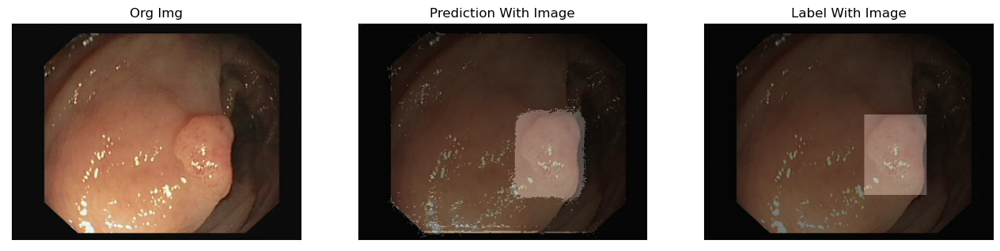

Epoch 18:  80%|████████  | 4/5 [00:28<00:07,  7.12s/batch, epoch_iou=0.917, epoch_loss=0.498, iou=0.893, loss=0.508, phase=Training]

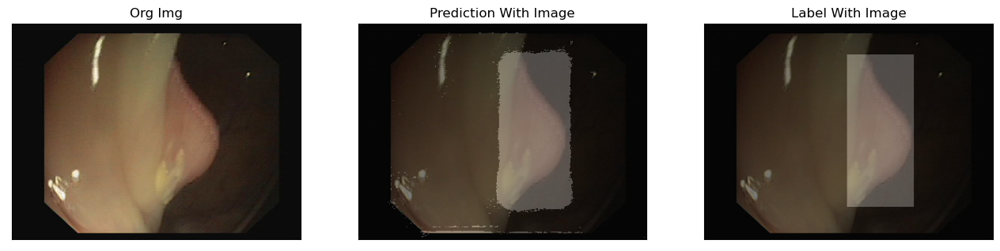

Epoch 18: 100%|██████████| 5/5 [00:35<00:00,  7.11s/batch, epoch_iou=0.915, epoch_loss=0.499, iou=0.909, loss=0.501, phase=Training]
/var/folders/jf/_kgy0y7s2zvg0q5kprq71fz40000gn/T/ipykernel_24885/1161143194.py:74: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_train = df_train.append(train_row, ignore_index=True)


Adjusting learning rate of group 0 to 1.2500e-05.


Epoch 18:  20%|██        | 1/5 [00:02<00:09,  2.32s/batch, epoch_iou=0.717, epoch_loss=0.526, iou=0.717, loss=0.526, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 18:  40%|████      | 2/5 [00:04<00:06,  2.29s/batch, epoch_iou=0.704, epoch_loss=0.53, iou=0.691, loss=0.534, phase=Validation] 

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 18:  60%|██████    | 3/5 [00:06<00:04,  2.25s/batch, epoch_iou=0.707, epoch_loss=0.529, iou=0.714, loss=0.528, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 18:  80%|████████  | 4/5 [00:09<00:02,  2.24s/batch, epoch_iou=0.692, epoch_loss=0.535, iou=0.649, loss=0.553, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 18: 100%|██████████| 5/5 [00:11<00:00,  2.26s/batch, epoch_iou=0.681, epoch_loss=0.537, iou=0.635, loss=0.543, phase=Validation]
/var/folders/jf/_kgy0y7s2zvg0q5kprq71fz40000gn/T/ipykernel_24885/1161143194.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_val = df_val.append(val_row, ignore_index=True)


val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 19: 100%|██████████| 5/5 [00:36<00:00,  7.23s/batch, epoch_iou=0.918, epoch_loss=0.498, iou=0.911, loss=0.5, phase=Training]  
/var/folders/jf/_kgy0y7s2zvg0q5kprq71fz40000gn/T/ipykernel_24885/1161143194.py:74: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_train = df_train.append(train_row, ignore_index=True)


Adjusting learning rate of group 0 to 6.2500e-06.


Epoch 19:  20%|██        | 1/5 [00:02<00:08,  2.22s/batch, epoch_iou=0.717, epoch_loss=0.525, iou=0.717, loss=0.525, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 19:  40%|████      | 2/5 [00:04<00:06,  2.33s/batch, epoch_iou=0.704, epoch_loss=0.529, iou=0.692, loss=0.533, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 19:  60%|██████    | 3/5 [00:07<00:04,  2.35s/batch, epoch_iou=0.707, epoch_loss=0.529, iou=0.713, loss=0.527, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 19:  80%|████████  | 4/5 [00:09<00:02,  2.33s/batch, epoch_iou=0.693, epoch_loss=0.535, iou=0.65, loss=0.553, phase=Validation] 

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 19: 100%|██████████| 5/5 [00:11<00:00,  2.31s/batch, epoch_iou=0.682, epoch_loss=0.536, iou=0.637, loss=0.542, phase=Validation]
/var/folders/jf/_kgy0y7s2zvg0q5kprq71fz40000gn/T/ipykernel_24885/1161143194.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_val = df_val.append(val_row, ignore_index=True)


val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 20:   0%|          | 0/5 [00:00<?, ?batch/s]

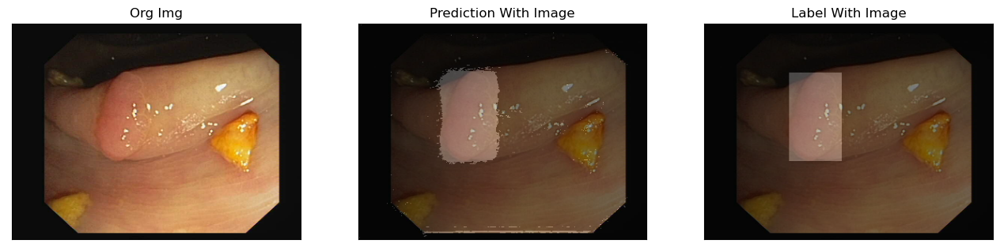

Epoch 20:  20%|██        | 1/5 [00:07<00:29,  7.46s/batch, epoch_iou=0.927, epoch_loss=0.493, iou=0.927, loss=0.493, phase=Training]

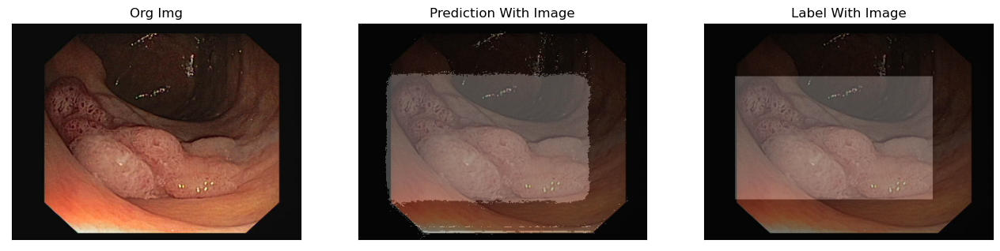

Epoch 20:  40%|████      | 2/5 [00:14<00:21,  7.23s/batch, epoch_iou=0.925, epoch_loss=0.494, iou=0.923, loss=0.494, phase=Training]

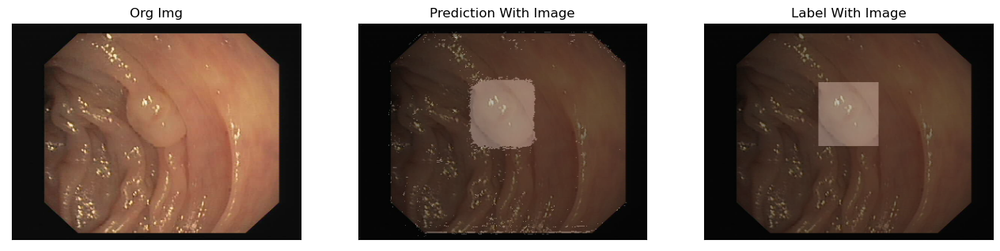

Epoch 20:  60%|██████    | 3/5 [00:21<00:14,  7.22s/batch, epoch_iou=0.929, epoch_loss=0.493, iou=0.936, loss=0.491, phase=Training]

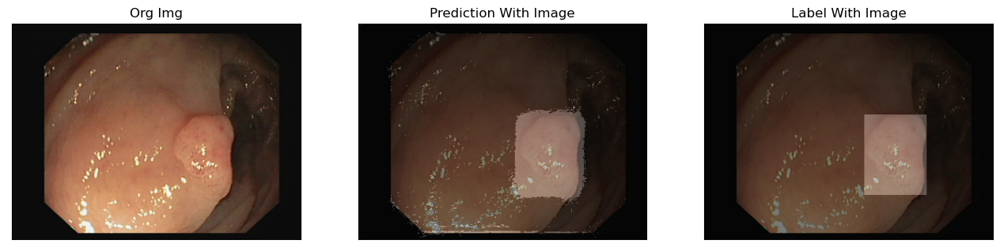

Epoch 20:  80%|████████  | 4/5 [00:28<00:07,  7.19s/batch, epoch_iou=0.921, epoch_loss=0.496, iou=0.898, loss=0.506, phase=Training]

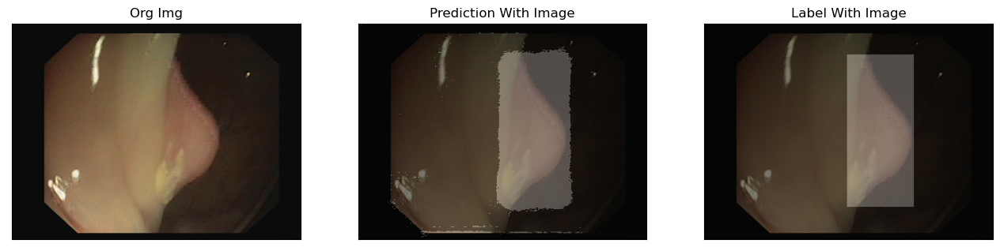

Epoch 20: 100%|██████████| 5/5 [00:35<00:00,  7.19s/batch, epoch_iou=0.92, epoch_loss=0.497, iou=0.913, loss=0.499, phase=Training] 
/var/folders/jf/_kgy0y7s2zvg0q5kprq71fz40000gn/T/ipykernel_24885/1161143194.py:74: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_train = df_train.append(train_row, ignore_index=True)


Adjusting learning rate of group 0 to 6.2500e-06.


Epoch 20:  20%|██        | 1/5 [00:02<00:09,  2.26s/batch, epoch_iou=0.717, epoch_loss=0.525, iou=0.717, loss=0.525, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 20:  40%|████      | 2/5 [00:04<00:06,  2.28s/batch, epoch_iou=0.704, epoch_loss=0.529, iou=0.691, loss=0.533, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 20:  60%|██████    | 3/5 [00:06<00:04,  2.27s/batch, epoch_iou=0.707, epoch_loss=0.529, iou=0.713, loss=0.527, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 20:  80%|████████  | 4/5 [00:09<00:02,  2.25s/batch, epoch_iou=0.693, epoch_loss=0.535, iou=0.65, loss=0.553, phase=Validation] 

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])


Epoch 20: 100%|██████████| 5/5 [00:11<00:00,  2.26s/batch, epoch_iou=0.682, epoch_loss=0.536, iou=0.638, loss=0.542, phase=Validation]

val_out.shape torch.Size([10, 2, 288, 384])
val_label.shape torch.Size([10, 288, 384])



/var/folders/jf/_kgy0y7s2zvg0q5kprq71fz40000gn/T/ipykernel_24885/1161143194.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_val = df_val.append(val_row, ignore_index=True)


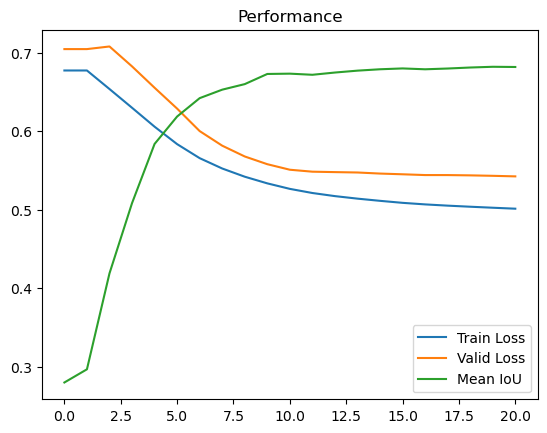

Epoch 21:  40%|████      | 2/5 [00:16<00:24,  8.17s/batch, epoch_iou=0.927, epoch_loss=0.493, iou=0.924, loss=0.494, phase=Training]

In [3]:

for epoch in range(START_EPOCH, N_EPOCHS):
    model.train()
    batch, running_epoch_iou, running_epoch_loss = 0, 0.0, 0.0
    with tqdm(train_loader, unit="batch") as tepoch:
        for train_inputs, train_labels, train_org_images in tepoch:
            batch += 1
            optimizer.zero_grad(set_to_none=True)
            tepoch.set_description(f"Epoch {epoch}")
            train_inputs, train_labels, train_org_images = (
                train_inputs.to(DEVICE),
                train_labels.to(DEVICE),
                train_org_images.to(DEVICE),
            )
            # forward
            train_outputs = model(train_inputs).to(DEVICE)
            out_max = (
                torch.argmax(train_outputs, dim=1, keepdim=True)[:, -1, :, :]
                .cpu()
                .detach()
                .numpy()
            )
            train_loss = criterion(train_outputs, train_labels)
            train_loss.backward()
            if epoch % PER_X_EPOCH == 0 and batch % PER_X_BATCH == 0:
                return_batch_information(
                    train_org_images,
                    out_max,
                    train_labels,
                    1,
                    CLASSES,
                    label_colors=label_colors,
                )
            optimizer.step()
            model.eval()
            train_iou_score = jaccard(train_outputs, train_labels).to(DEVICE).item()
            model.train()
            running_epoch_iou += train_iou_score
            train_loss = float(train_loss.item())
            running_epoch_loss += train_loss
            # print statistics
            tepoch.set_postfix(
                phase="Training",
                loss=train_loss,
                iou=train_iou_score,
                epoch_iou=running_epoch_iou / batch,
                epoch_loss=running_epoch_loss / batch,
            )
        train_mean_epoch_iou, train_mean_epoch_loss = (
            running_epoch_iou / batch,
            running_epoch_loss / batch,
        )
    if best_train_loss > train_mean_epoch_loss:
        best_train_loss = train_mean_epoch_loss
    if best_train_iou < train_mean_epoch_iou:
        best_train_iou = train_mean_epoch_iou
    # Save results to dataframe
    if epoch == 0:
        train_row = {
            "epoch": int(epoch),
            "loss": float(train_mean_epoch_loss),
            "avg_loss": float(train_mean_epoch_loss),
            "mean_iou": float(train_mean_epoch_iou),
        }
    else:
        # Get moving average
        train_avg = df_train["loss"].ewm(com=0.99).mean()
        train_row = {
            "epoch": int(epoch),
            "loss": float(train_loss),
            "avg_loss": train_avg[(epoch - 1)],
            "mean_iou": train_mean_epoch_iou,
        }

    df_train = df_train.append(train_row, ignore_index=True)
    # Decay Learning Rate at x steps
    if LEARNING_RATE_SCHEDULING == True:
        scheduler.step()
    # Delete variables to free memory
    del running_epoch_iou, running_epoch_loss, train_loss, train_iou_score

    ### Running validation loop
    batch, running_epoch_iou, running_epoch_loss = 0, 0.0, 0.0
    model.eval()
    with torch.no_grad():
        with tqdm(val_loader, unit="batch") as tepoch:
            for val_inputs, val_labels, val_org_images in tepoch:
                
                
                batch += 1
                tepoch.set_description(f"Epoch {epoch}")
                val_inputs, val_labels, val_org_images = (
                    val_inputs.to(DEVICE),
                    val_labels.to(DEVICE),
                    val_org_images.to(DEVICE),
                )
                # forward
                val_outputs = model(val_inputs)
                
                # Collect metrics
                print(f"val_out.shape {val_outputs.shape}")
                print(f"val_label.shape {val_labels.shape}")
                
                val_iou_score = jaccard(val_outputs, val_labels).item()
                val_loss = criterion(val_outputs, val_labels).item()
                # Collect data for dataframe
                running_epoch_iou += val_iou_score
                running_epoch_loss += val_loss
                # print statistics
                tepoch.set_postfix(
                    phase="Validation",
                    loss=val_loss,
                    iou=val_iou_score,
                    epoch_iou=running_epoch_iou / batch,
                    epoch_loss=running_epoch_loss / batch,
                )
        val_mean_epoch_iou, val_mean_epoch_loss = (
            running_epoch_iou / batch,
            running_epoch_loss / batch,
        )
        # Save results to dataframe
        if epoch == 0:
            val_row = {
                "epoch": int(epoch),
                "loss": float(val_mean_epoch_loss),
                "avg_loss": float(val_mean_epoch_loss),
                "mean_iou": val_mean_epoch_iou,
            }
        else:
            val_avg = df_val["loss"].ewm(com=0.99).mean()
            val_row = {
                "epoch": int(epoch),
                "loss": float(val_loss),
                "avg_loss": val_avg[(epoch - 1)],
                "mean_iou": val_mean_epoch_iou,
            }
        df_val = df_val.append(val_row, ignore_index=True)
        if best_valid_loss > val_mean_epoch_loss:
            # Update best metrics
            best_valid_loss = val_mean_epoch_loss
        if best_valid_iou < val_mean_epoch_iou:
            best_valid_iou = val_mean_epoch_iou
            best_model = copy.deepcopy(model)
            if epoch > 25 and EXPORT_BEST_MODEL == True:
                model_name = "_".join(
                    [
                        datestring,
                        STATE,
                        MODE,
                        DECODER,
                        OPTIMIZER,
                        LOSS,
                        ENCODER,
                        str(len(train_dataset)),
                        "images",
                        LOSS,
                        "loss",
                        str(best_valid_loss).replace(".", "_"),
                        "iou",
                        str(val_mean_epoch_iou),
                        "epoch",
                        str(epoch),
                        ".pth",
                    ]
                )
                # save model
                path = os.path.join(BEST_MODEL_DIR, model_name)
                torch.save(best_model.state_dict(), path)
                print(f"Model saved! Name is {model_name}")
                
        if epoch % PER_X_EPOCH_PLOT == 0:
            plt.plot(df_train["epoch"], df_train["avg_loss"], label="Train Loss")
            plt.plot(df_val["epoch"], df_val["avg_loss"], label="Valid Loss")
            plt.plot(df_val["epoch"], df_val["mean_iou"], label="Mean IoU")
            plt.legend()
            plt.title("Performance")
            plot = plt.gcf()
            plt.show()
        train_df_name = "_".join(
            [
                datestring,
                "train",
                MODE,
                DECODER,
                OPTIMIZER,
                LOSS,
                ENCODER,
                str(len(train_dataset)),
                "images",
                ".csv",
            ]
        )
        valid_df_name = "_".join(
            [
                datestring,
                "valid",
                MODE,
                DECODER,
                OPTIMIZER,
                LOSS,
                ENCODER,
                str(len(train_dataset)),
                "images",
                ".csv",
            ]
        )
        df_train.to_csv(os.path.join(EXPORT_CSV_DIR, train_df_name))
        df_val.to_csv(os.path.join(EXPORT_CSV_DIR, valid_df_name))
        if epoch > 5:
            last_runs = df_train["loss"][-5:]
            # Get min and max of that window
            min_loss_last_runs = last_runs.min()
            max_loss_last_runs = last_runs.max()
            difference = max_loss_last_runs - min_loss_last_runs
            if difference < 0.001:
                print("Stopped Training because it doesn't improve anymore.")
                train_end_time = time.time()
                # Get minutes and seconds to write to ML flow
                train_mins, train_secs = epoch_time(train_start_time, train_end_time)
                batch, running_epoch_iou, running_epoch_loss = 0, 0.0, 0.0
                best_model.eval()
                with torch.no_grad():
                    with tqdm(test_loader, unit="batch") as tepoch:
                        for test_inputs, test_labels, test_org_images in tepoch:
                            batch += 1
                            tepoch.set_description(f"Epoch {epoch}")
                            test_inputs, test_labels, test_org_images = (
                                test_inputs.to(DEVICE),
                                test_labels.to(DEVICE),
                                test_org_images.to(DEVICE),
                            )
                            # forward
                            test_outputs = best_model(test_inputs)
                            # Collect metrics
                            test_iou_score = jaccard(test_outputs, test_labels).item()
                            test_loss = criterion(test_outputs, test_labels).item()
                            # Collect data for dataframe
                            running_epoch_iou += test_iou_score
                            running_epoch_loss += test_loss
                            # print statistics
                            tepoch.set_postfix(
                                phase="Validation",
                                loss=test_loss,
                                iou=test_iou_score,
                                epoch_iou=running_epoch_iou / batch,
                                epoch_loss=running_epoch_loss / batch,
                            )
                    test_mean_epoch_iou, test_mean_epoch_loss = (
                        running_epoch_iou / batch,
                        running_epoch_loss / batch,
                    )
                print("")
                print(
                    f"Performance on test set: {val_mean_epoch_iou} IoU and {val_mean_epoch_loss} Loss"
                )
                print(f"Training time was {train_mins, train_secs}")
                early_stopped += 1
                break
if early_stopped == 0:
    train_end_time = time.time()
    # Get minutes and seconds to write to ML flow
    train_mins, train_secs = epoch_time(train_start_time, train_end_time)
    # End run and get status
    batch, running_epoch_iou, running_epoch_loss = 0, 0.0, 0.0
    best_model.eval()
    with torch.no_grad():
        with tqdm(test_loader, unit="batch") as tepoch:
            for test_inputs, test_labels, test_org_images in tepoch:
                batch += 1
                tepoch.set_description(f"Epoch {epoch}")
                test_inputs, test_labels, test_org_images = (
                    test_inputs.to(DEVICE),
                    test_labels.to(DEVICE),
                    test_org_images.to(DEVICE),
                )
                # forward
                test_outputs = best_model(test_inputs)
                # Collect metrics
                test_iou_score = jaccard(test_outputs, test_labels).item()
                test_loss = criterion(test_outputs, test_labels).item()
                # Collect data for dataframe
                running_epoch_iou += test_iou_score
                running_epoch_loss += test_loss
                # print statistics
                tepoch.set_postfix(
                    phase="Validation",
                    loss=test_loss,
                    iou=test_iou_score,
                    epoch_iou=running_epoch_iou / batch,
                    epoch_loss=running_epoch_loss / batch,
                )
        test_mean_epoch_iou, test_mean_epoch_loss = (
            running_epoch_iou / batch,
            running_epoch_loss / batch,
        )
    print(f"Training time was {train_mins, train_secs}")
